In [395]:
import cv2

In [396]:
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from scipy.misc import imsave
import xml.etree.ElementTree as ET

### GRAB PATHS

In [397]:
data_path = '/notebooks/WhatRThose/data/'

In [398]:
def grab_paths(data_path):
    imgs = []
    labels = [] 
    for root, dirs, files in os.walk(data_path):
        for file in files:
            if file.split('.')[-1]=='xml':
                labels.append(os.path.join(root,file))
                continue
            else:
                if file[0]!='.' and file[:3]!='ann':
                    imgs.append(os.path.join(root,file))
    imgs.sort()            
    labels.sort()
    return imgs, labels

In [399]:
imgs_paths, labels_paths = grab_paths(data_path)

### CREATE TRAIN / VAL ANNOTATION FILES 

In [400]:
def train_test_split(imgs_paths, labels_paths, split):
    total_imgs = len(imgs_paths)
    train_size = int(total_imgs*split)
    val_size = total_imgs - train_size

    # randomly select train indices 
    train_idx = np.random.choice(a=np.arange(total_imgs),size=train_size, replace=False)
    val_idx = np.delete(np.arange(total_imgs),train_idx, axis=0)
    
    train_idx.sort()
    val_idx.sort()
    
    print('Number of train images: {}'.format(train_size))
    print('Number of val images: {}'.format(val_size))
    
    return train_idx, val_idx 

In [401]:
def grab_box(labels_path):
    tree = ET.parse(labels_path)
    root = tree.getroot()
    s = ET.tostring(root, encoding='utf8').decode('utf8')
    tree = ET.fromstring(s)
    file = tree.find('path').text
    bboxes = []
    for object_ in tree.findall('object'):
        xmin = object_.find('bndbox/xmin').text
        xmax = object_.find('bndbox/xmax').text
        ymin = object_.find('bndbox/ymin').text
        ymax = object_.find('bndbox/ymax').text            
        bboxes.append([xmin,ymin,xmax,ymax])
    return bboxes

In [402]:
def create_annotation(imgs_paths, labels_paths, split):
    
    imgs_paths.sort()
    labels_paths.sort()
    
    file = [] 
    x1 = []
    y1 = [] 
    x2 = [] 
    y2 = [] 
    label = [] 
    area = []
    length = []
    datasets = []
    
    train_idx, val_idx = train_test_split(imgs_paths, labels_paths, split)

    cols = ['file','x1','y1','x2','y2','label']
    for data in ['train','val']:
        file = [] 
        x1 = []
        y1 = [] 
        x2 = [] 
        y2 = [] 
        label = [] 
        if data == 'train':
            idx = train_idx
        if data =='val':
            idx = val_idx 
        for i in idx:
            img_path = imgs_paths[i]
            label_path = labels_paths[i]
            bboxes = grab_box(label_path)
            for bbox in bboxes:
                file.append(img_path)
                x1.append(bbox[0])
                y1.append(bbox[1])
                x2.append(bbox[2])
                y2.append(bbox[3])
                label.append('shoe')
        dataset = pd.DataFrame({'file':file,'x1':x1,'y1':y1,'x2':x2,'y2':y2,'label':label})
        dataset = dataset[cols]
        dataset.to_csv(os.path.join(data_path,'annotation_'+'{}'.format(data)+'.csv'), sep=',', index=False, header=False)
        datasets.append(dataset)
    return datasets

**<font color='green'>Set split percentage here:</font>**

In [392]:
split = 0.95

In [393]:
annotations = create_annotation(imgs_paths, labels_paths, split)

Number of train images: 406
Number of val images: 22


### CHECK RANDOM OBSERVATIONS

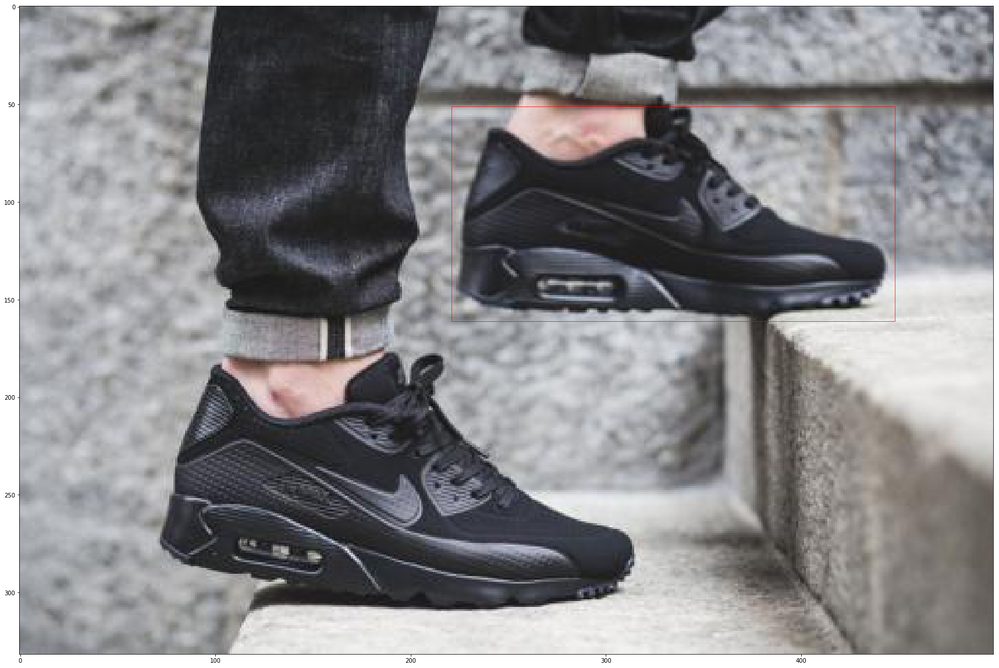

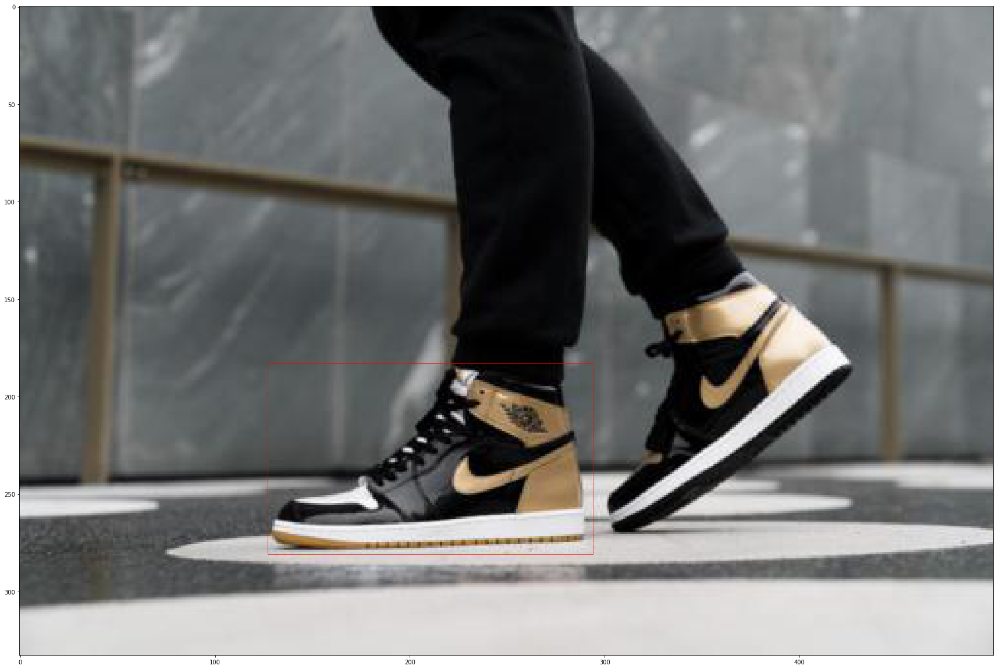

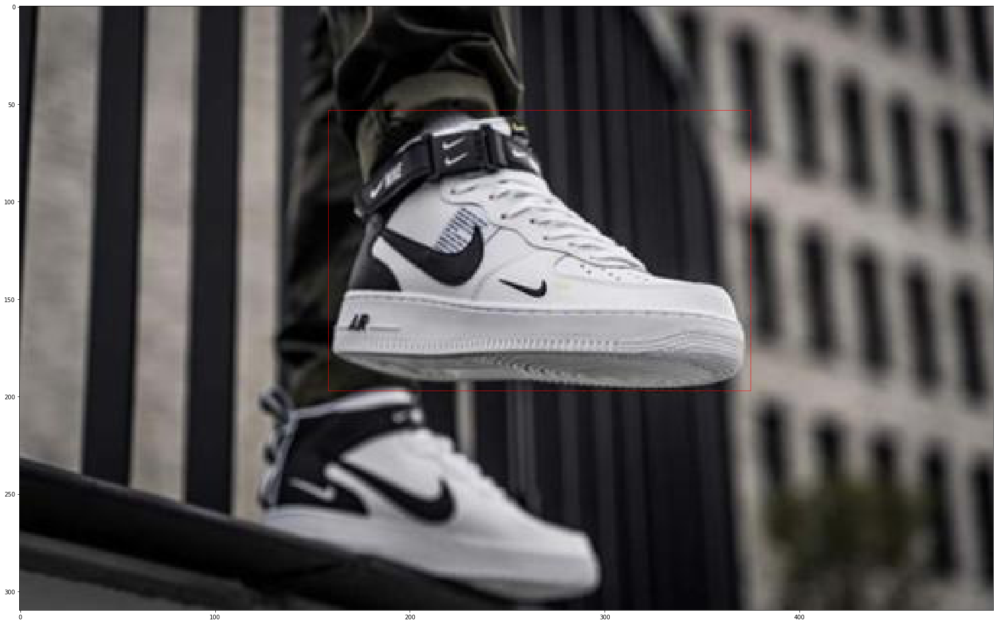

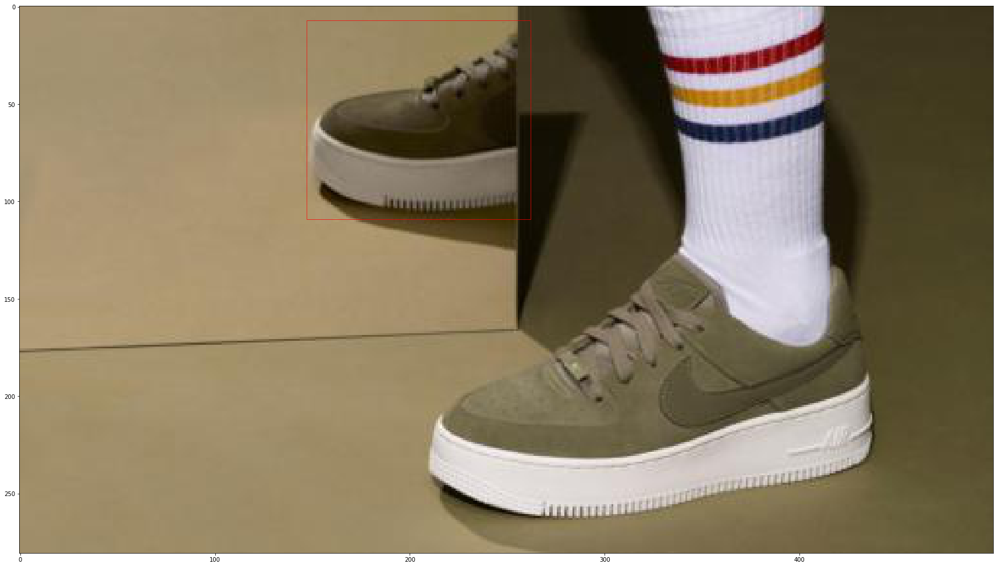

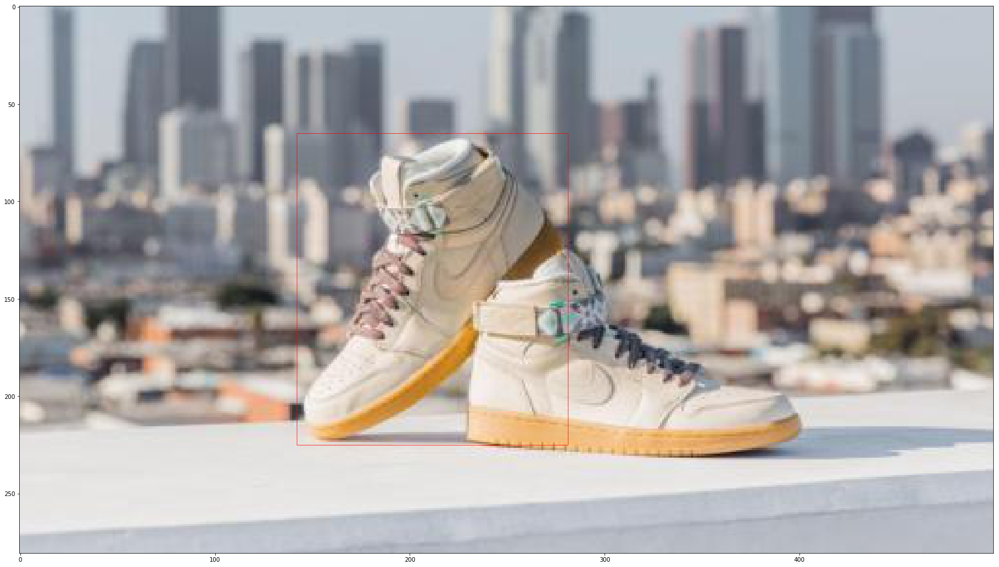

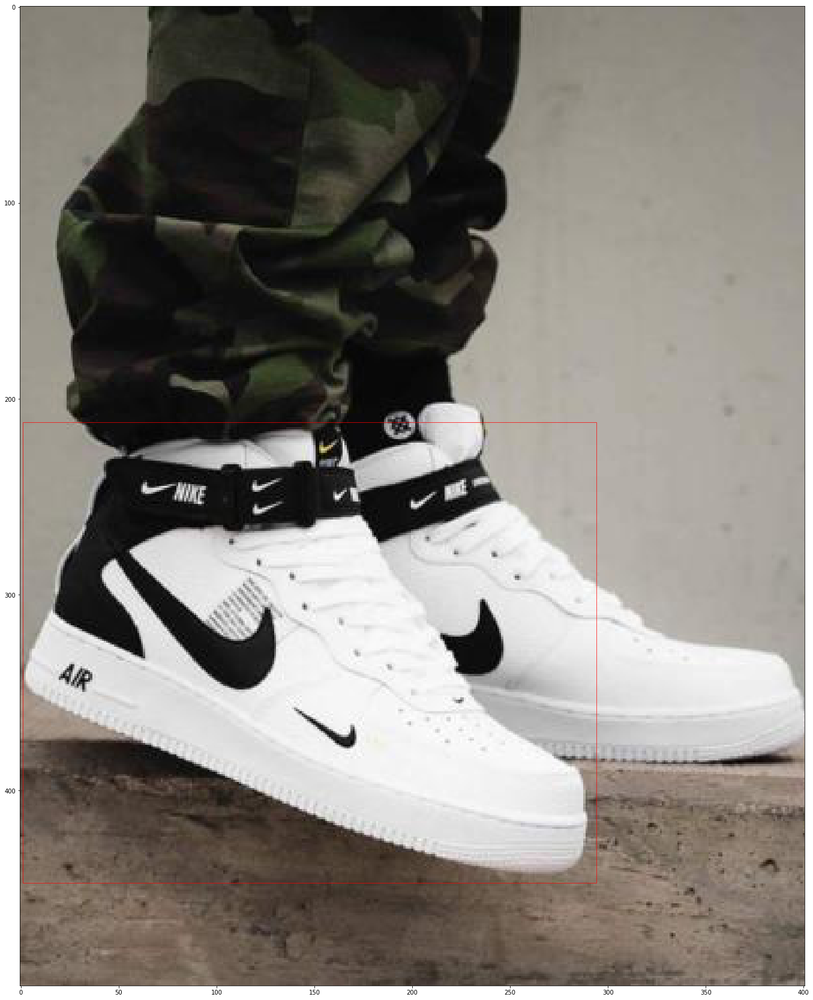

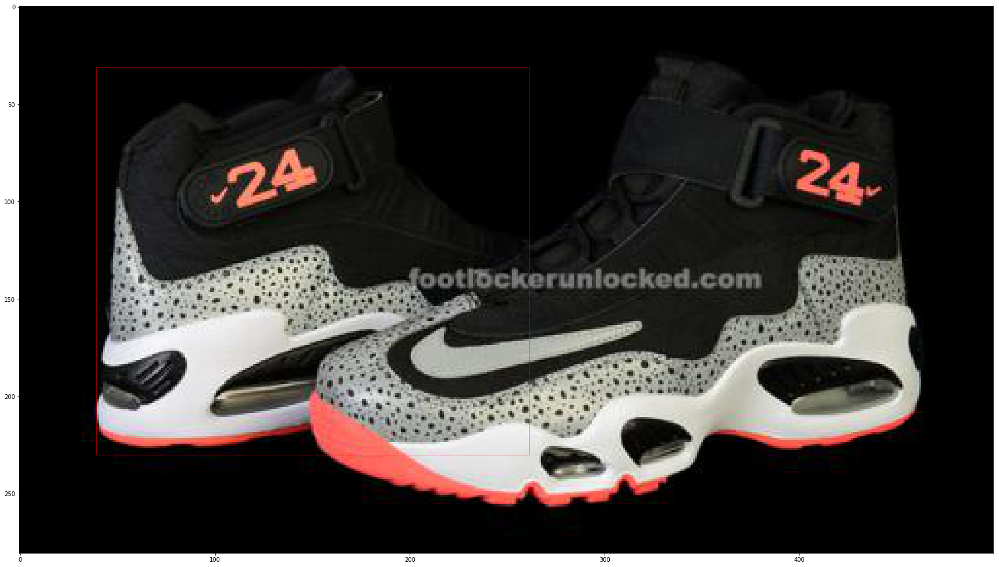

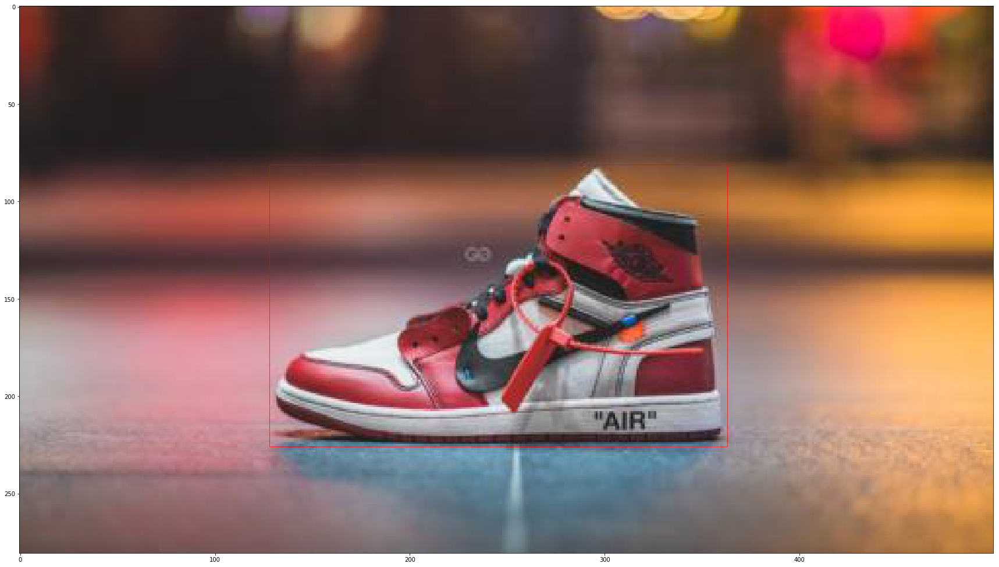

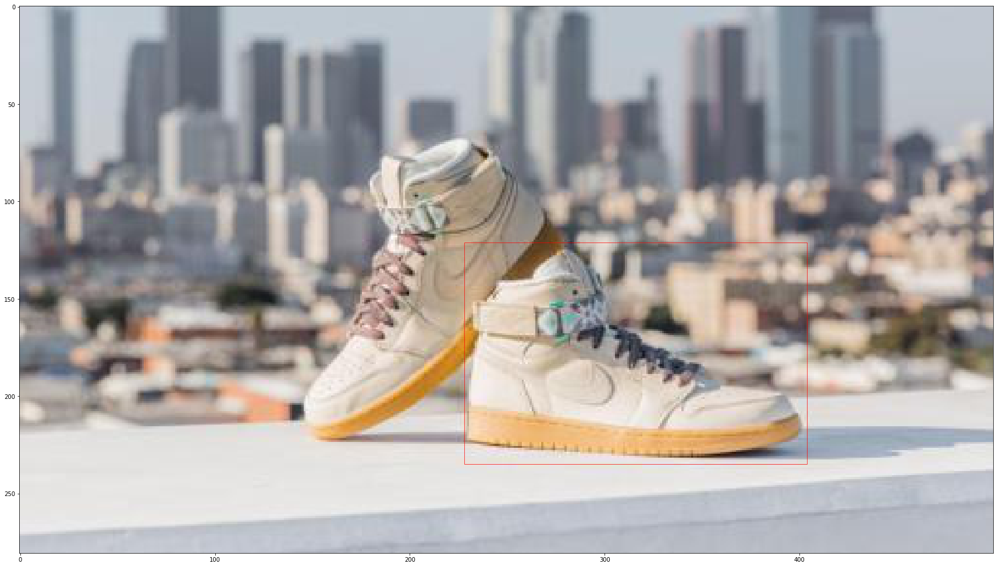

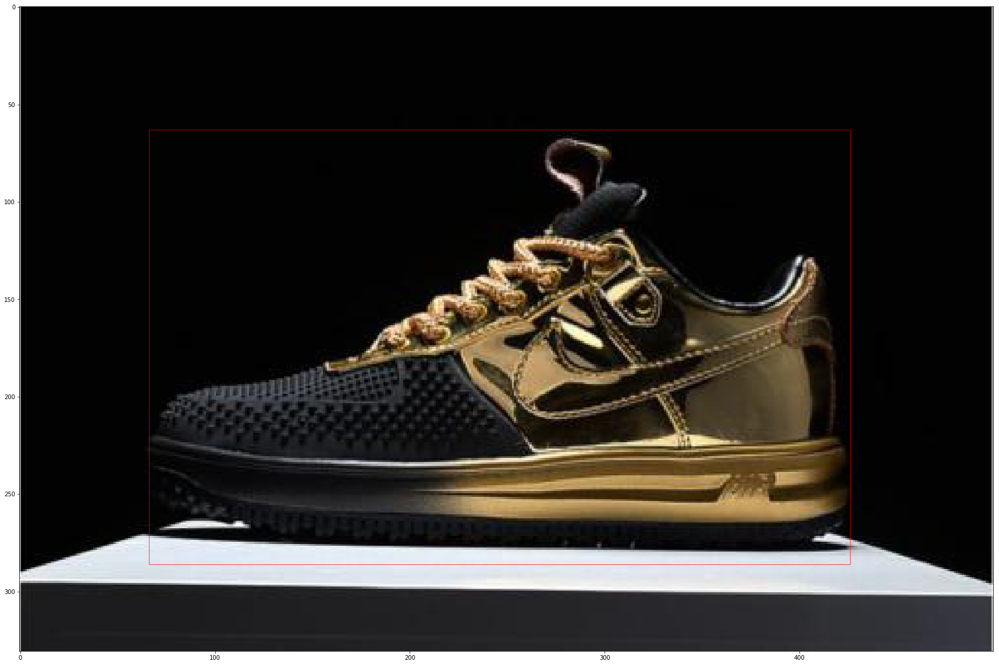

In [327]:
annotation = annotations[1]

idxs = np.random.choice(a=np.arange(len(annotation)),size=10, replace=False)

for i in idxs:
    img = plt.imread(annotation.iloc[i]['file'])

    fig, axes = plt.subplots(1,1,figsize=(30,30))
    x1 = int(annotation.iloc[i]['x1'])
    y1 = int(annotation.iloc[i]['y1'])
    x2 = int(annotation.iloc[i]['x2'])
    y2 = int(annotation.iloc[i]['y2'])
    p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=1,
                    alpha=0.7, linestyle="-",
                    edgecolor='red', facecolor='none')
    axes.add_patch(p)
    axes.imshow(img)

_____

### Adding image augmentation component to data loader:

In [328]:
import random

In [329]:
import datetime
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import skimage.draw
import sys

# Root directory of the project
ROOT_DIR = os.path.abspath('/notebooks/WhatRThose/FPN_RCNN/FPN_FRCNN_master/')
sys.path.append(ROOT_DIR)  # To find local version of the library

# Import Faster RCNN
import WhatRThose_config 
import frcnn.model_ks as modellib 
from frcnn import utils, visualize
from frcnn.config import Config

In [330]:
pd.read_csv("/notebooks/WhatRThose/data/annotation_train.csv")

,/notebooks/WhatRThose/data/Air_Force_1/Nike_Air_Force_1_Shoes_on_Feet_0.jpg,13,110,409,321,shoe
0,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,82,136,323,273,shoe
1,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,312,172,404,276,shoe
2,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,41,41,342,233,shoe
3,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,329,44,460,230,shoe
4,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,8,31,490,283,shoe
5,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,76,50,322,326,shoe
6,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,267,125,418,261,shoe
7,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,51,39,459,247,shoe
8,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,96,41,246,458,shoe
9,/notebooks/WhatRThose/data/Air_Force_1/Nike_Ai...,252,43,403,455,shoe


In [41]:
TEST_DIR_TRAIN = "/notebooks/WhatRThose/data/annotation_train.csv"
TEST_DIR_VAL = "/notebooks/WhatRThose/data/annotation_val.csv"
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
IMNET_MODEL_PATH = os.path.join(ROOT_DIR, "resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5")

In [42]:
# Load Train dataset
dataset_train = WhatRThose_config.Dataset()
dataset_train.load_data(TEST_DIR_TRAIN,"train")
dataset_train.prepare()

# Load Val dataset
dataset_val = WhatRThose_config.Dataset()
dataset_val.load_data(TEST_DIR_VAL,"val")
dataset_val.prepare()

Parsing annotation train files
406 train files
Parsing annotation val files
22 val files


In [348]:
config = WhatRThose_config.run1()

In [353]:
idxs = np.random.choice(np.arange(len(dataset_train.image_info)),10)

In [372]:
bbox

array([[255.24324324, 357.4954955 , 583.17117117, 809.74774775],
       [417.40540541, 195.33333333, 631.81981982, 420.55855856]])

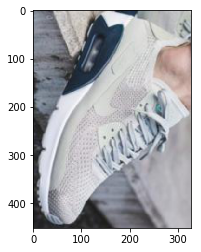

In [375]:
plt.imshow(image[357:809,255:583])

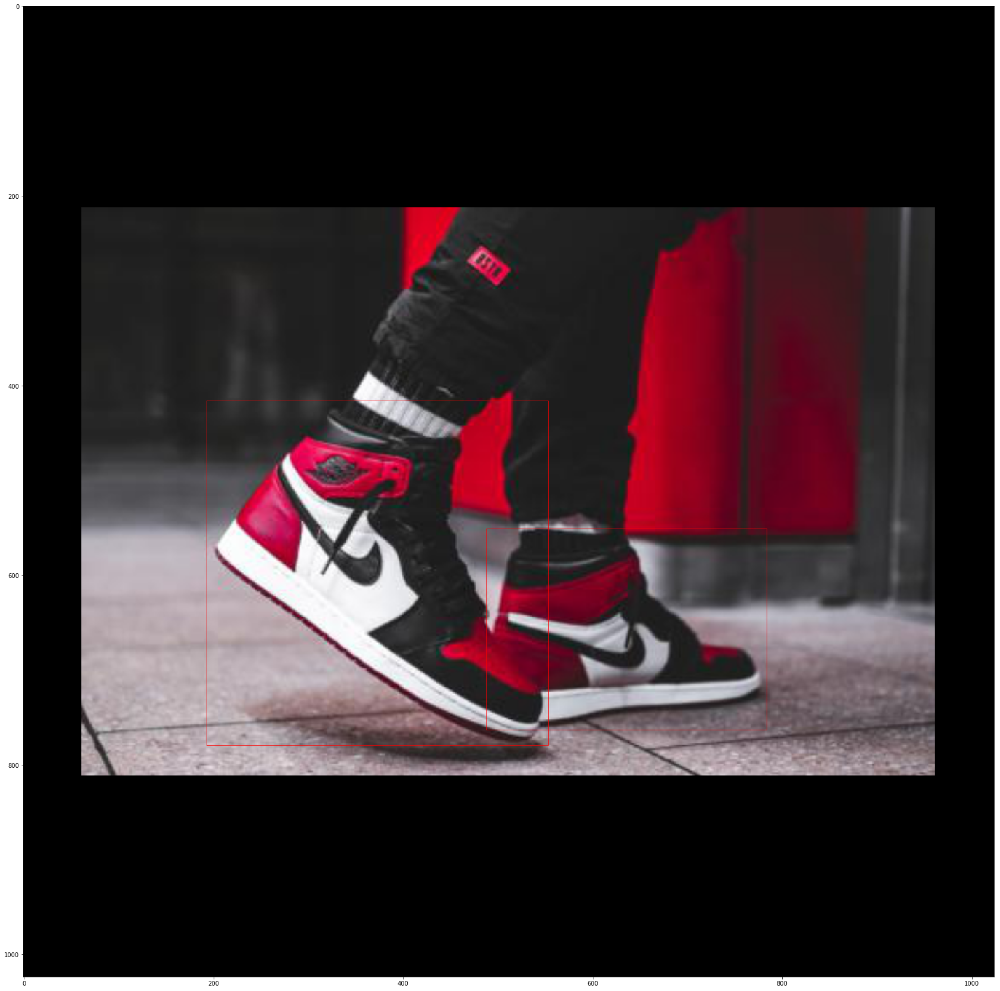

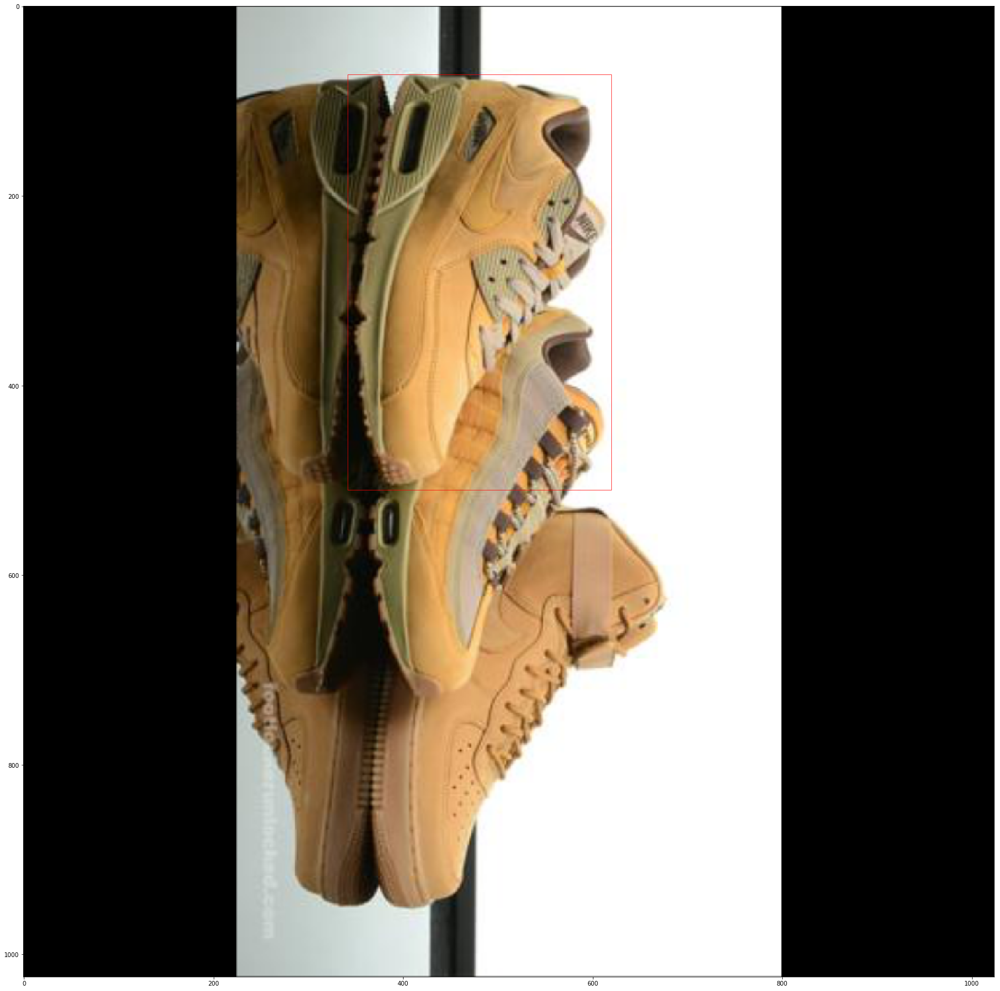

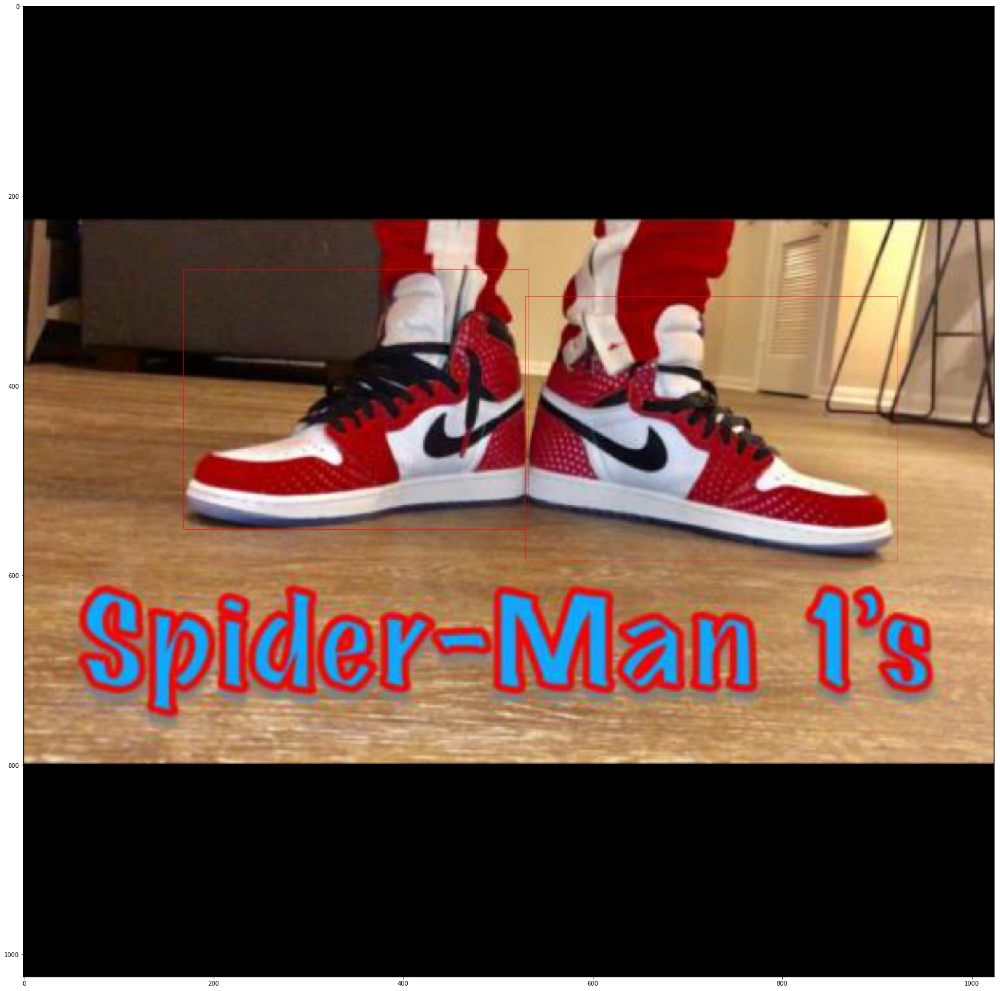

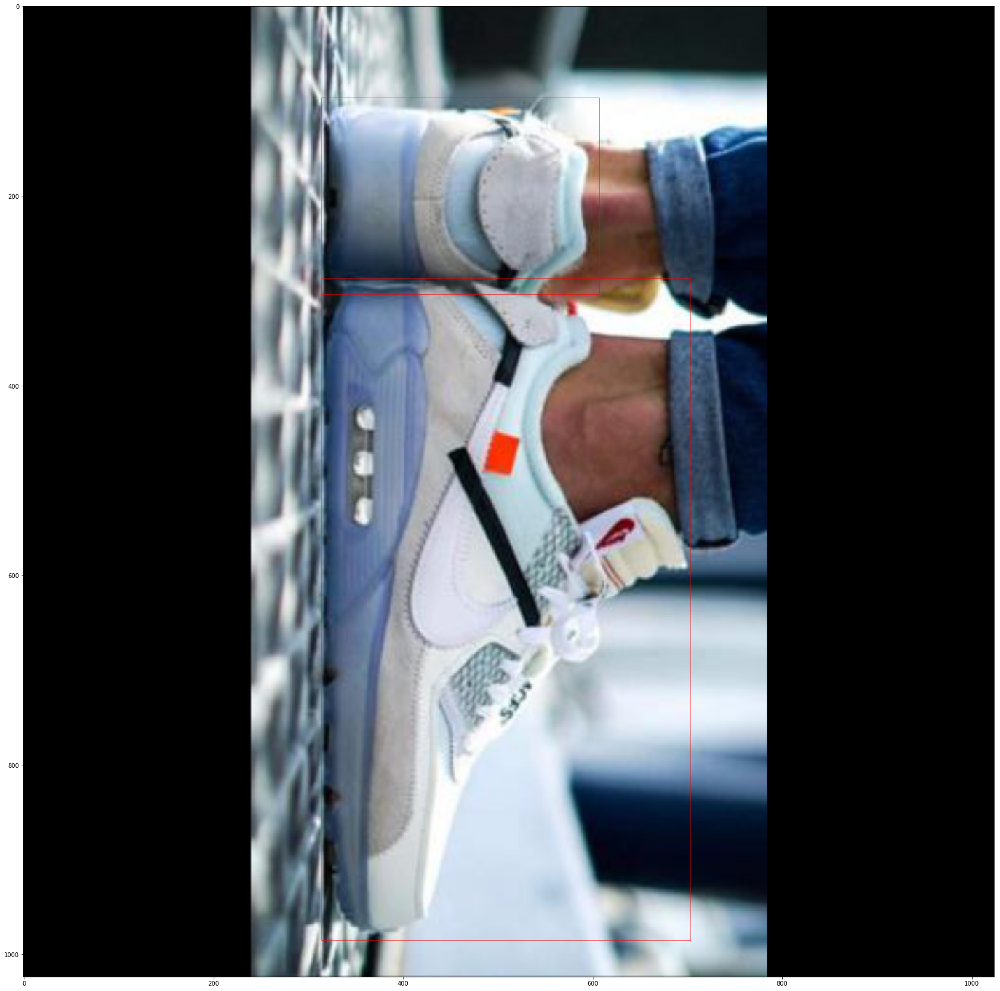

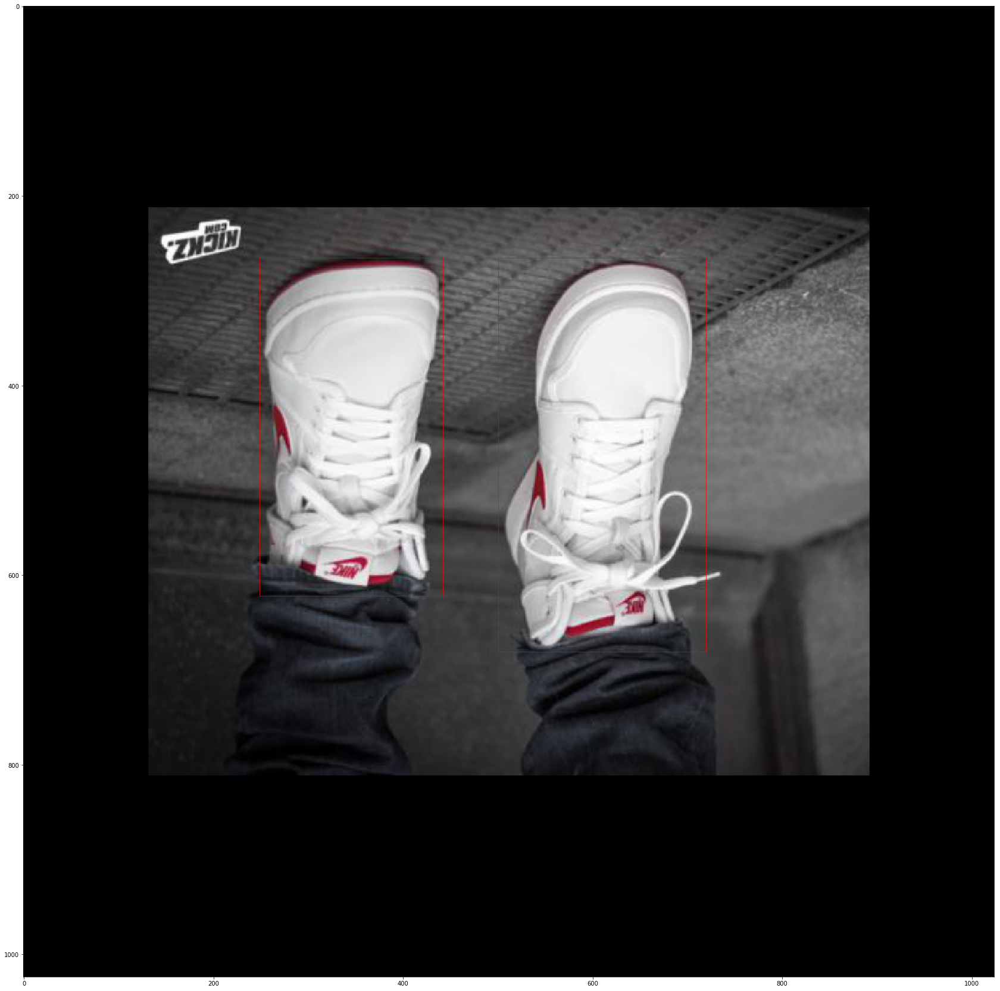

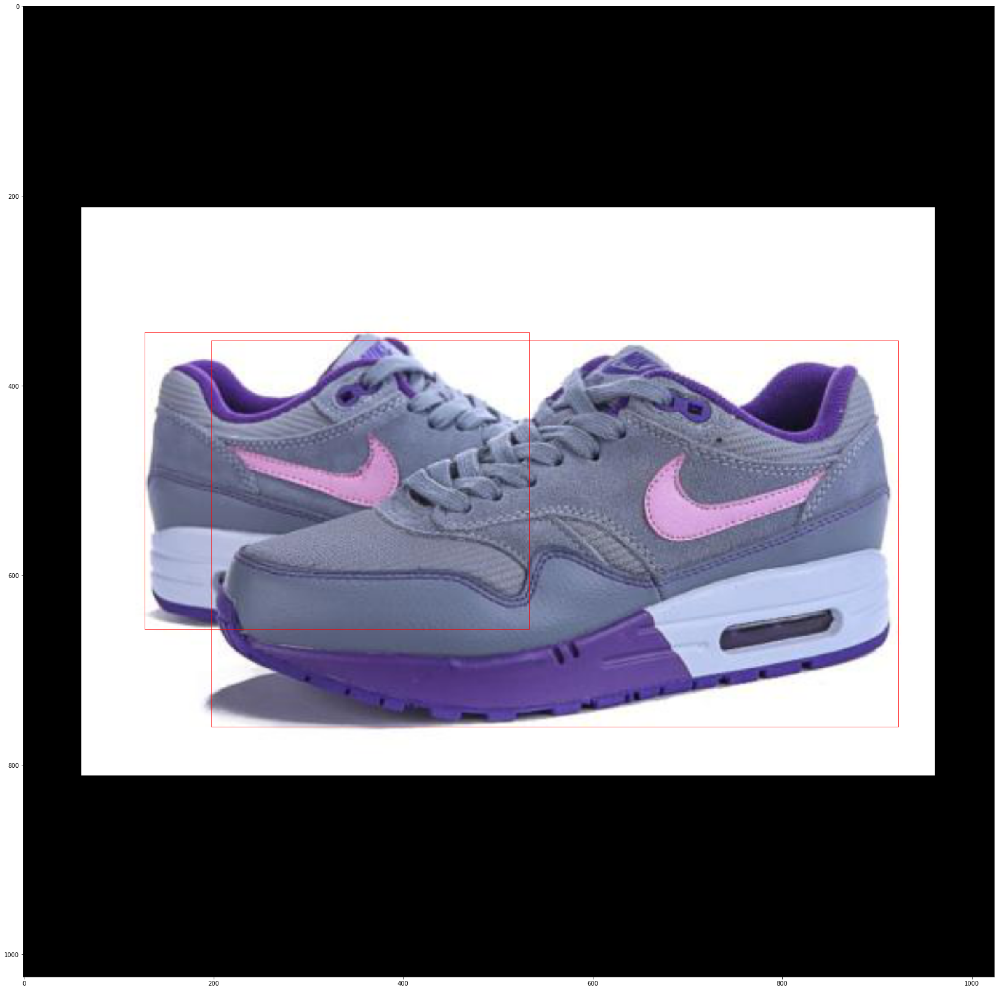

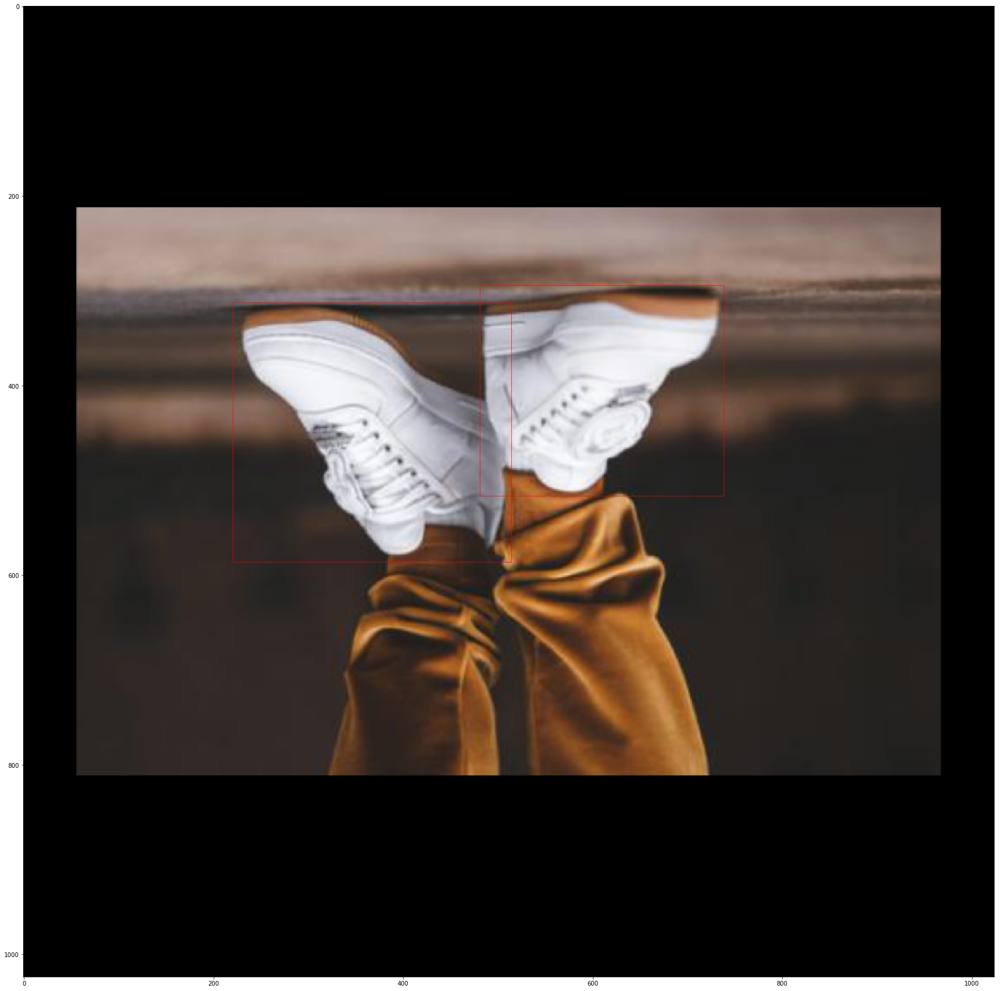

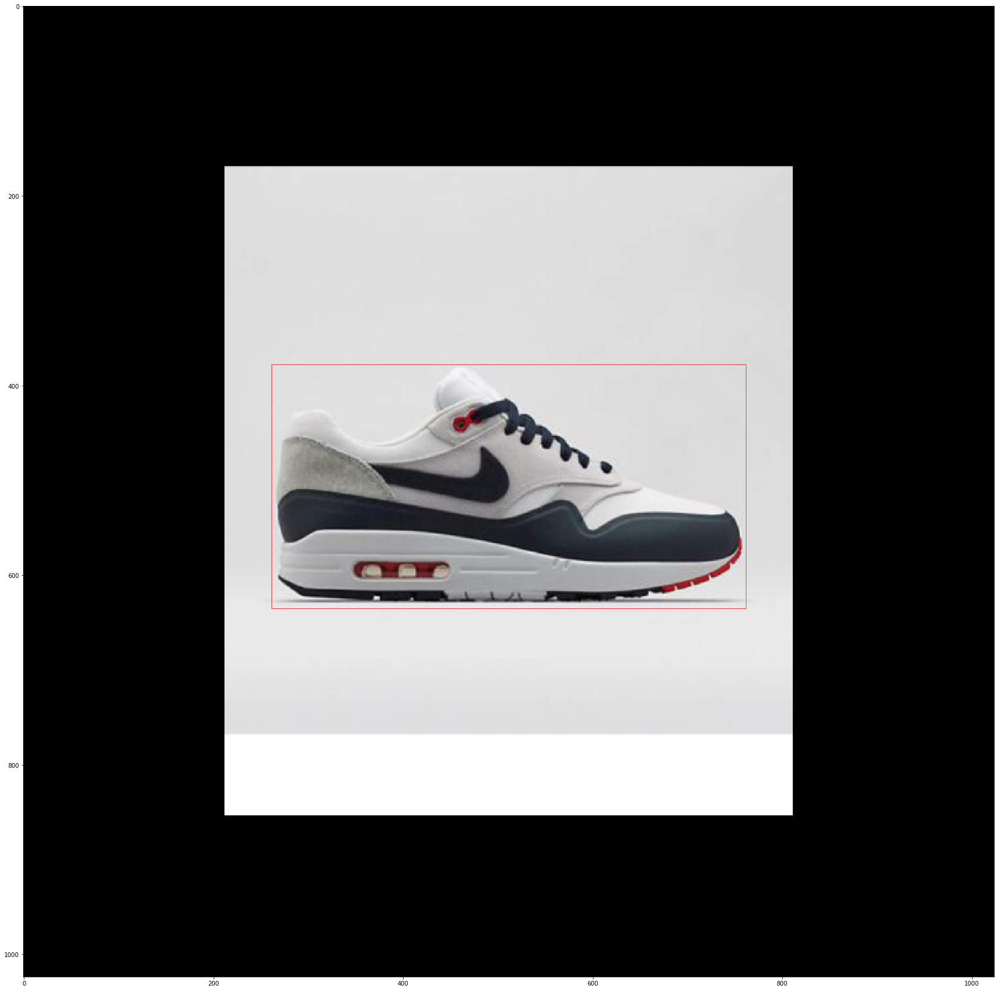

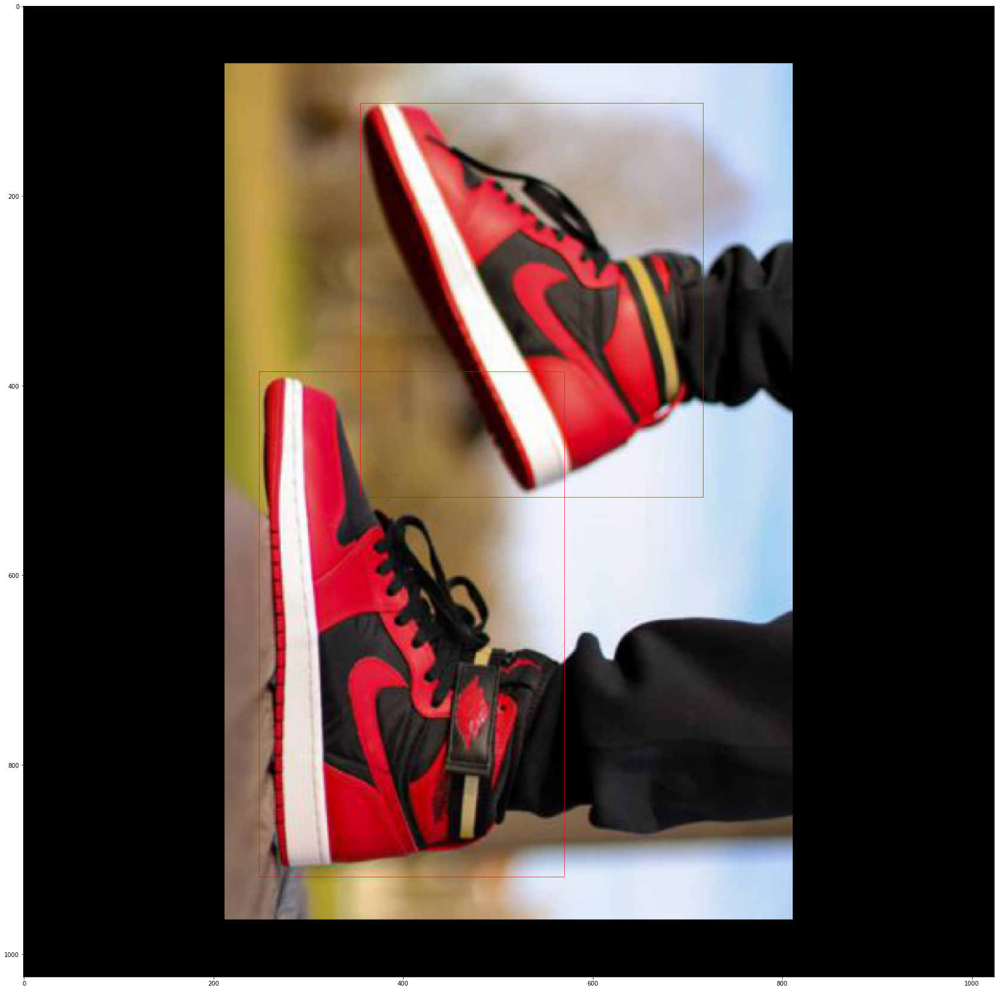

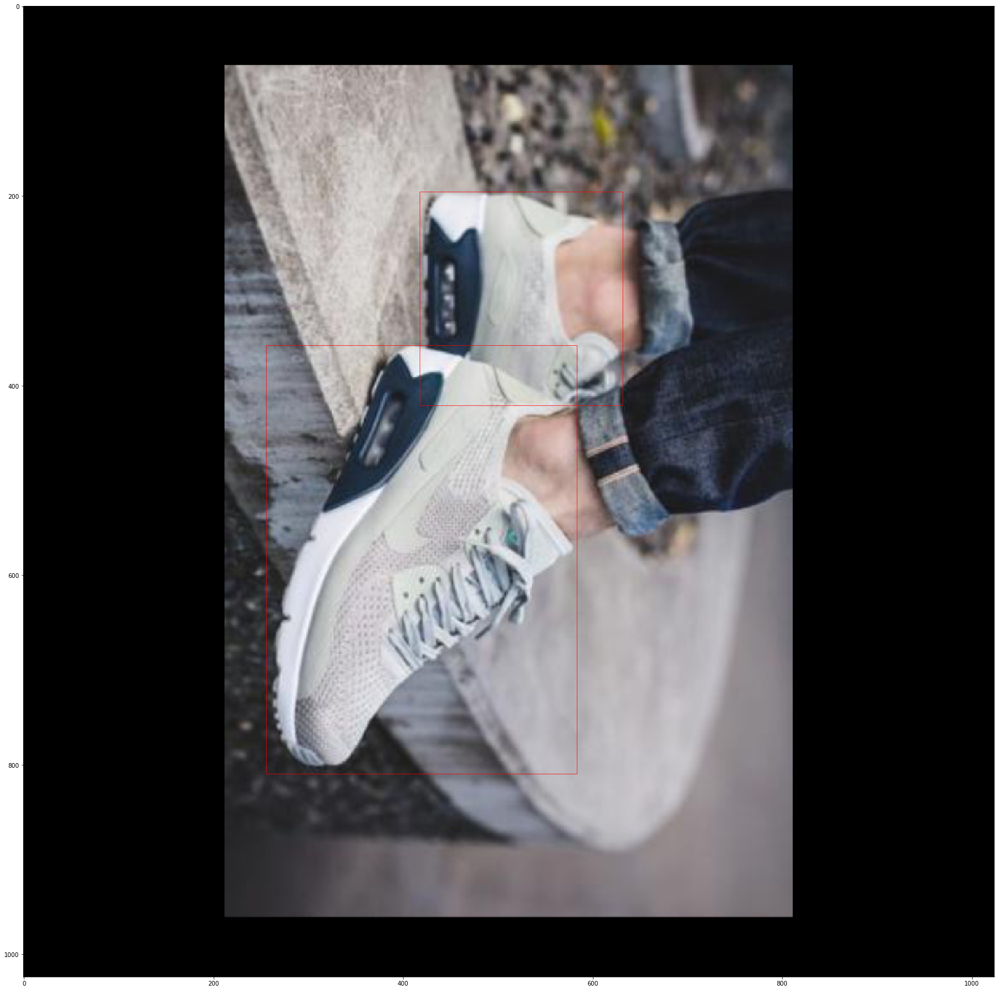

In [369]:
for idx in idxs:
    image, image_meta, class_ids, bbox = load_image_gt(dataset_train, config, idx, augment=True, augmentation=None,
                  use_mini_mask=False)
    fig, axes = plt.subplots(1,1,figsize=(30,30))
    for box in bbox:
        x1 = box[0]
        y1 = box[1]
        x2 = box[2]
        y2 = box[3]
        p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=1,
                    alpha=0.7, linestyle="-",
                    edgecolor='red', facecolor='none')
        axes.add_patch(p)
    axes.imshow(image)

In [368]:
def rotate(img, bboxes, angle):

    rows, cols = img.shape[:2]
    
    # flip the original image 
    if angle == 90:
        img = np.rot90(img,k=1)
    elif angle == 180:
        img = np.rot90(img,k=2)
    elif angle == 270:
        img = np.rot90(img,k=-1)
        # rotate the bounding box coordinates
    rotated_bboxes = np.empty((1,4))
    for bbox in bboxes:
        x1_o = bbox[0]
        y1_o = bbox[1]
        x2_o = bbox[2]
        y2_o = bbox[3]
        if angle == 270:
            x1 = cols - y2_o
            x2 = cols - y1_o
            y1 = x1_o
            y2 = x2_o
        elif angle == 180:
            x2 = cols - x1_o
            x1 = cols - x2_o
            y2 = rows - y1_o
            y1 = rows - y2_o
        elif angle == 90:
            x1 = y1_o
            x2 = y2_o
            y1 = rows - x2_o
            y2 = rows - x1_o
        # append rotated bboxes 
        else:
            x1 = x1_o
            y1 = y1_o
            x2 = x2_o 
            y2 = y2_o
        rotated_bboxes = np.append(rotated_bboxes, np.array([[x1,y1,x2,y2]]), axis=0)
    
    return img, rotated_bboxes[1:] 


In [359]:
def hflip(img, bboxes):
    
    img = np.flip(img,axis=1)
    rows, cols = img.shape[:2]
    # flip the bounding box coordinates
    flipped_bboxes = np.empty((1,4))
    for bbox in bboxes:       
        x1_o = bbox[0]
        x2_o = bbox[2]
        y1 = bbox[1]
        y2 = bbox[3]  
        x1 = rows - x1_o
        x2 = rows - x2_o
        flipped_bboxes = np.append(flipped_bboxes, np.array([[x1,y1,x2,y2]]), axis=0)

    return img, flipped_bboxes[1:]

In [365]:
def vflip(img, bboxes):
    
    img = np.flip(img,axis=0)
    rows, cols = img.shape[:2]
    # flip the bounding box coordinates
    flipped_bboxes = np.empty((1,4))
    for bbox in bboxes:        
        x1 = bbox[0]
        x2 = bbox[2]            
        y1_o = bbox[1]
        y2_o = bbox[3]
        y1 = cols - y2_o
        y2 = cols - y1_o
        flipped_bboxes = np.append(flipped_bboxes, np.array([[x1,y1,x2,y2]]), axis=0)

    return img, flipped_bboxes[1:]

In [367]:
def load_image_gt(dataset, config, image_id, augment=True, augmentation=None,
                  use_mini_mask=False):
    """Load and return ground truth data for an image (image, mask, bounding boxes).

    augment: (deprecated. Use augmentation instead). If true, apply random
        image augmentation. Currently, only horizontal flipping is offered.
    augmentation: Optional. An imgaug (https://github.com/aleju/imgaug) augmentation.
        For example, passing imgaug.augmenters.Fliplr(0.5) flips images
        right/left 50% of the time.
    use_mini_mask: If False, returns full-size masks that are the same height
        and width as the original image. These can be big, for example
        1024x1024x100 (for 100 instances). Mini masks are smaller, typically,
        224x224 and are generated by extracting the bounding box of the
        object and resizing it to MINI_MASK_SHAPE.

    Returns:
    image: [height, width, 3]
    shape: the original shape of the image before resizing and cropping.
    class_ids: [instance_count] Integer class IDs of the instance masks, do I need this?
    bbox: [instance_count, (y1, x1, y2, x2)]
    mask: [height, width, instance_count]. The height and width are those
        of the image unless use_mini_mask is True, in which case they are
        defined in MINI_MASK_SHAPE.
    """
    # Load image and mask
    image = dataset.load_image(image_id)
    class_ids = dataset.load_class(image_id)
    original_shape = image.shape
    image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)
    
    # resize bboxes along with image 
    # bbox: [num_instances, (y1, x1, y2, x2)]
    bbox = utils.extract_bboxes(dataset.image_info[image_id]['bboxes'])
    bbox = resize_bbox(bbox, scale, padding)


    # TODO: will be removed in a future update in favor of augmentation
    if augment:
        # horizontal flip 
        if random.randint(0, 1) == 1:
            image, bbox = hflip(image,bbox)
        # vertical flip 
        if random.randint(0, 1) == 1:
            image, bbox = vflip(image,bbox)
        # rotation 
        angle = np.random.choice([0,90,180,270],1)[0]
        image,bbox = rotate(image,bbox,angle)

    # Active classes
    # Different datasets have different classes, so track the
    # classes supported in the dataset of this image.
    active_class_ids = np.zeros([dataset.num_classes], dtype=np.int32)
    source_class_ids = dataset.source_class_ids[dataset.image_info[image_id]["source"]]
    active_class_ids[source_class_ids] = 1


    # Image meta data
    image_meta = compose_image_meta(image_id, original_shape, image.shape,
                                    window, scale, active_class_ids)


    return image, image_meta, class_ids, bbox
#     return image, class_ids, bbox

In [346]:
def resize_bbox(boxes, scale, padding):
    """Resizes a bbox using the given scale and padding.
    Typically, you get the scale and padding from resize_image() to
    ensure both, the image and the bbox, are resized consistently.

    scale: bbox scaling factor
    padding: Padding to add to the bbox in the form
            [(top, bottom), (left, right), (0, 0)]
    """
    top_pad = padding[0][0]
    left_pad = padding[1][0]

    resized_boxes = []
    for box in boxes:
        temp_new_box = box * scale
        x1 = temp_new_box[0] + left_pad
        y1 = temp_new_box[1] + top_pad 
        x2 = temp_new_box[2] + left_pad
        y2 = temp_new_box[3] + top_pad 
        resized_boxes.append((x1,y1,x2,y2))
    return np.array(resized_boxes)

In [347]:
def compose_image_meta(image_id, original_image_shape, image_shape,
                       window, scale, active_class_ids):
    """Takes attributes of an image and puts them in one 1D array.

    image_id: An int ID of the image. Useful for debugging.
    original_image_shape: [H, W, C] before resizing or padding.
    image_shape: [H, W, C] after resizing and padding
    window: (y1, x1, y2, x2) in pixels. The area of the image where the real
            image is (excluding the padding)
    scale: The scaling factor applied to the original image (float32)
    active_class_ids: List of class_ids available in the dataset from which
        the image came. Useful if training on images from multiple datasets
        where not all classes are present in all datasets.
    """
    meta = np.array(
        [image_id] +                  # size=1
        list(original_image_shape) +  # size=3
        list(image_shape) +           # size=3
        list(window) +                # size=4 (y1, x1, y2, x2) in image cooredinates
        [scale] +                     # size=1
        list(active_class_ids)        # size=num_classes
    )
    return meta